NASA data request (for historic data >10 days old) https://firms.modaps.eosdis.nasa.gov/download/create.php

In [144]:
import geopandas
import matplotlib.pyplot as plt
from cartopy import crs as ccrs
import pandas as pd
from geodatasets import get_path

In [145]:
!jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: ok


In [146]:
path = get_path("naturalearth.land")
world = geopandas.read_file(path)


world.plot()

<IPython.core.display.Javascript object>

<Axes: >

In [147]:
MAP_KEY = "fcc83411cdb5df7bc5a5dff1dc70cb67"

In [148]:
url = "https://firms.modaps.eosdis.nasa.gov/mapserver/mapkey_status/?MAP_KEY=" + MAP_KEY
try:
    df = pd.read_json(url, typ="series")
    display(df)
except:
    # possible error, wrong MAP_KEY value, check for extra quotes, missing letters
    print("There is an issue with the query. \nTry in your browser: %s" % url)

There is an issue with the query. 
Try in your browser: https://firms.modaps.eosdis.nasa.gov/mapserver/mapkey_status/?MAP_KEY=fcc83411cdb5df7bc5a5dff1dc70cb67


In [142]:
def get_transaction_count():
    count = 0
    try:
        df = pd.read_json(url, typ="series")
        count = df["current_transactions"]
    except:
        print("Error in our call.")
    return count

In [143]:
da_url = (
    "https://firms.modaps.eosdis.nasa.gov/api/data_availability/csv/" + MAP_KEY + "/all"
)
df = pd.read_csv(da_url)
display(df)

KeyboardInterrupt: 

In [96]:
past_n_days = 10

In [97]:
rus_url = f"https://firms.modaps.eosdis.nasa.gov/api/country/csv/{MAP_KEY}/MODIS_NRT/RUS/{past_n_days}"
df_rus = pd.read_csv(rus_url)

In [98]:
ukr_url = f"https://firms.modaps.eosdis.nasa.gov/api/country/csv/{MAP_KEY}/MODIS_NRT/UKR/{past_n_days}"
df_ukr = pd.read_csv(ukr_url)

In [99]:
df_rus = pd.read_csv("data/modis_2023_Russian_Federation.csv")
df_ukr = pd.read_csv("data/modis_2023_Ukraine.csv")

In [100]:
df_ukr["country"] = "UKR"
df_rus["country"] = "RUS"

In [101]:
df_ukr.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type,country
0,48.4572,38.7695,325.0,1.0,1.0,2023-01-02,1855,Terra,MODIS,100,61.03,273.9,28.6,N,2,UKR
1,45.1292,35.0842,350.3,1.0,1.0,2023-01-03,828,Terra,MODIS,96,61.03,288.6,66.2,D,0,UKR
2,45.1272,35.0968,328.8,1.0,1.0,2023-01-03,828,Terra,MODIS,86,61.03,286.7,29.8,D,0,UKR
3,49.0680,23.9454,301.5,1.1,1.1,2023-01-17,1143,Aqua,MODIS,47,61.03,278.9,9.7,D,0,UKR
4,46.5276,32.6339,300.9,1.8,1.3,2023-01-19,1128,Aqua,MODIS,43,61.03,284.7,12.9,D,0,UKR


In [102]:
%matplotlib inline

---
Let's subset our dataset to show fire detections in or near Canada using FIRMS [Regional Coordinates](https://firms.modaps.eosdis.nasa.gov/active_fire/coordinates.html)

In [103]:
df = pd.concat([df_rus, df_ukr])
df["area"] = df["scan"] * df["track"]
gdf = geopandas.GeoDataFrame(
    df, geometry=geopandas.points_from_xy(df.longitude, df.latitude), crs="EPSG:4326"
)

In [104]:
gdf["latitude"].min()
# gdf["latitude"].max()

np.float64(41.3728)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

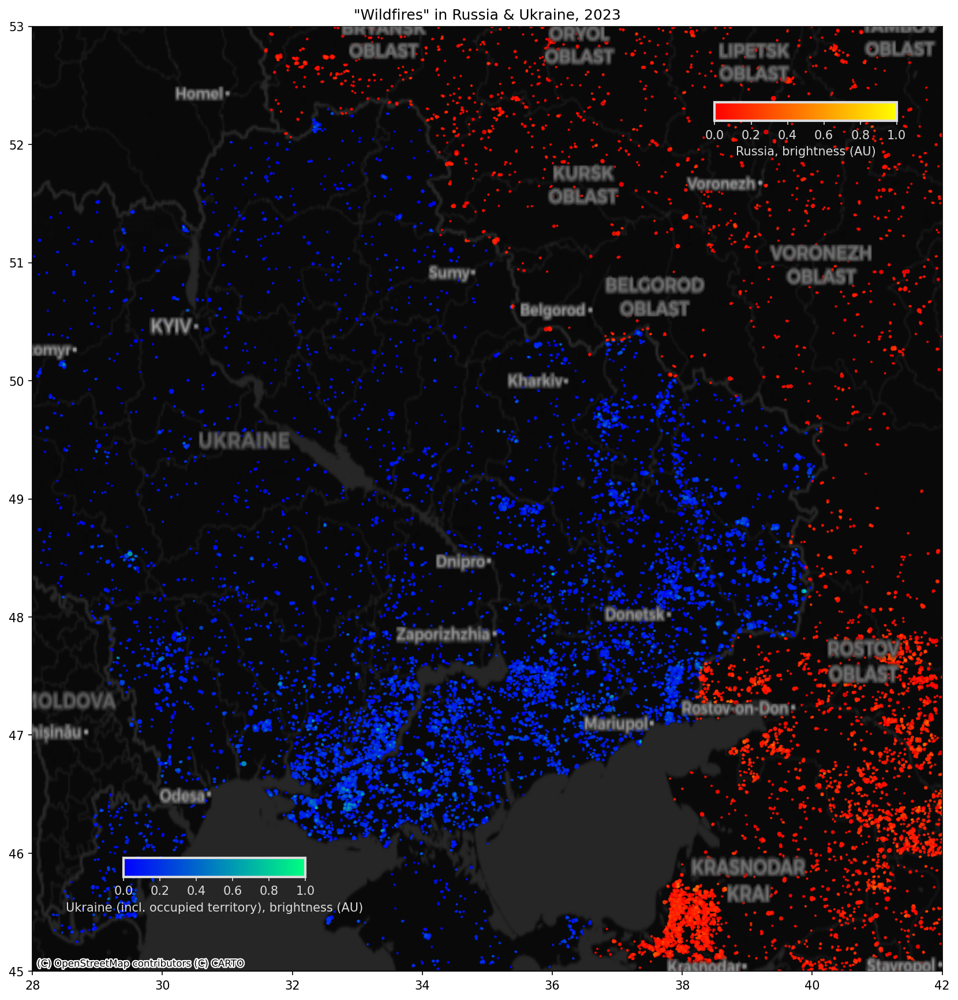

In [105]:
import contextily as cx
import seaborn as sns
from matplotlib.gridspec import GridSpec
# create subset
import numpy as np
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.colorbar import ColorbarBase



# plt.clf()
# plt.cla()

long_min = 45
long_max = 53
lat_min = 28
lat_max = 42


# set our extent
w = lat_max - lat_min
h = long_max - long_min
ratio = w / h

fig, ax = plt.subplots(figsize=(20, 20/ratio), layout="constrained")
world.plot(ax=ax, alpha=0, edgecolor=[0, 0, 0, 0])
ax.set_xlim([lat_min, lat_max])
ax.set_ylim([long_min, long_max])
# ax.set(title=f'"Wildfires" in Russia & Ukraine, past {past_n_days} days')
ax.set(title=f'"Wildfires" in Russia & Ukraine, 2023')

cx.add_basemap(
    ax, crs=gdf.crs.to_string(), source=cx.providers.CartoDB.DarkMatterNoLabels
)
mean_br = df["brightness"].mean()
std_br = df["brightness"].std()
gdf["brightness (norm)"] = df["brightness"].apply(lambda x: (x-mean_br)/ std_br)
gdf[gdf["country"] == "UKR"].sort_values(by="brightness (norm)", ascending=True).plot(
    ax=ax,
    column="brightness (norm)",
    zorder=1,
    cmap="winter",
    alpha=0.8,
    markersize="area",
    legend=False,
    legend_kwds={
        "orientation": "vertical",
        "pad": 0.05,
        "shrink": 0.5,
        "label": "Ukraine (incl. occupied territory)",
    },
)
#fig.colorbar(ukr_plot, cax=cbar_one, orientation="horizontal", label="Ukraine (incl. occupied territory)")
gdf[gdf["country"] == "RUS"].sort_values(by="brightness (norm)", ascending=True).plot(
    ax=ax,
    column="brightness (norm)",
    zorder=1,
    cmap="autumn",
    alpha=0.8,
    markersize="area",
    legend=False,
    legend_kwds={
        "orientation": "vertical",
        "pad": 0.05,
        "shrink": 0.5,
        "label": "Russia",
    },
)
cx.add_basemap(
    ax, crs=gdf.crs.to_string(), source=cx.providers.CartoDB.DarkMatterOnlyLabels
)
#cbaxes = inset_axes(ax, width="25%", height="2%", loc="lower left")
cbaxes = ax.inset_axes((0.1, 0.1, 0.2, 0.02))
cbar = ColorbarBase(cbaxes, cmap='winter', orientation="horizontal")
cbar.outline.set_color('gainsboro')
cbar.outline.set_linewidth(2)
cbar.set_label("Ukraine (incl. occupied territory), brightness (AU)", color="gainsboro")
cbar.ax.xaxis.set_tick_params(color="gainsboro")
plt.setp(plt.getp(cbaxes, 'xticklabels'), color="gainsboro")
cbar.outline.set_edgecolor("gainsboro")

cbaxes = ax.inset_axes((0.75, 0.90, 0.2, 0.02))
cbar = ColorbarBase(cbaxes, cmap='autumn', orientation="horizontal")
cbar.outline.set_edgecolor('gainsboro')
cbar.outline.set_linewidth(2)
cbar.set_label("Russia, brightness (AU)", color="gainsboro")
cbar.ax.xaxis.set_tick_params(color="gainsboro")
plt.setp(plt.getp(cbaxes, 'xticklabels'), color="gainsboro")
cbar.outline.set_edgecolor("gainsboro")
plt.show()

In [106]:
from matplotlib.widgets import RectangleSelector


def line_select_callback(eclick, erelease):
    pass


def make_selection(ax):
    r_select = RectangleSelector(
        ax,
        line_select_callback,
        useblit=True,
        button=[1],
        minspanx=5,
        minspany=5,
        spancoords="data",
        use_data_coordinates=True,
        interactive=True,
    )
    return r_select


def select_plot(gdf, world, lat_min, lat_max, long_min, long_max):
    global selection_finished
    global waiting_for_selection
    waiting_for_selection = True
    selection_finished = False

    # Plot code
    ax = world.plot(figsize=(20, 20 / ratio), alpha=0, edgecolor=[0, 0, 0, 0])
    ax.set_xlim([lat_min, lat_max])
    ax.set_ylim([long_min, long_max])
    ax.set(title='"Wildfires" in Russia & Ukraine, past 4 days')

    gdf.plot(ax=ax, column="brightness", cmap="autumn", alpha=0.8, markersize="area")
    cx.add_basemap(ax, crs=gdf.crs.to_string(), attribution_size=5)
    ax.set_axis_off()

    plt.show()

    r_select = make_selection(ax)
    return r_select

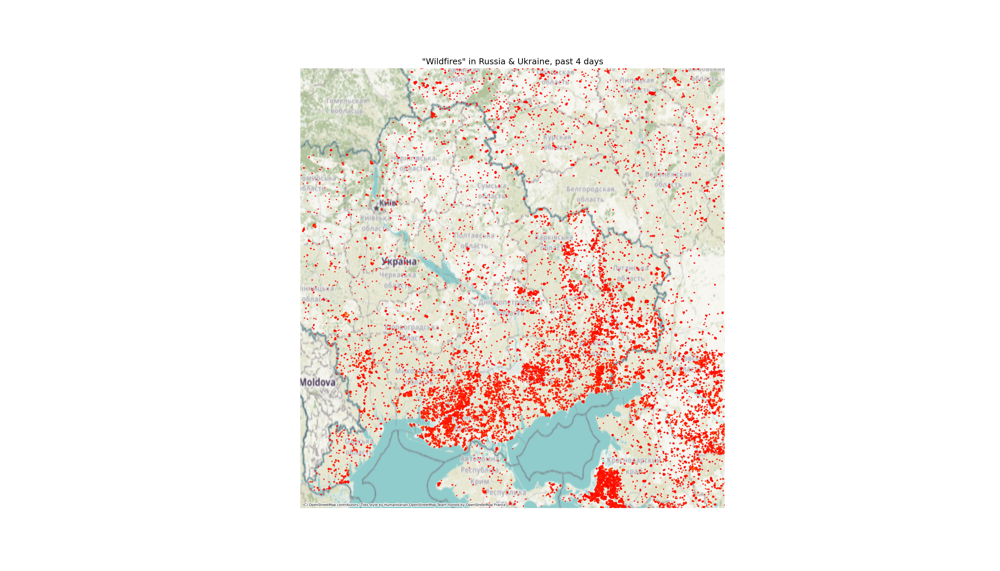

In [107]:
%matplotlib widget
r_select = select_plot(gdf, world,  lat_min, lat_max, long_min, long_max)

In [108]:
selection = r_select.extents
def select_to_bbox(selection):
    return [
        selection[0],
        selection[2],
        selection[1],
        selection[3]
    ]

In [109]:
%matplotlib inline

In [110]:
def select_gps_box(gdf, bbox):
    # bbox: [x1, y1, x2, y2]
    return gdf[
        (gdf["longitude"] > bbox[0])
        & (gdf["longitude"] < bbox[1])
        & (gdf["latitude"] > bbox[2])
        & (gdf["latitude"] < bbox[3])
    ]


gdf_select = select_gps_box(gdf, selection)

In [111]:
gdf_select

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type,country,area,geometry,brightness (norm)


In [112]:
ua_22 = pd.read_csv("data/modis/2022/modis_2022_Ukraine.csv" )
ru_22 = pd.read_csv("data/modis/2022/modis_2022_Russian_Federation.csv" )

In [113]:
ua_22["country"] = "UKR"
ru_22["country"]="RUS"
df_22 = pd.concat([ua_22, ru_22])

In [114]:
import pgeocode as pgc

In [115]:
nomi = pgc.Nominatim("ua")

In [116]:
loc_dict = {
    "Kyiv": "Київ",
    "Kharkiv": "Харків",
    "Bakhmut": "Бахмут",
    "Mariupol": "Маріуполь",
    "Odesa": "Одеса"
}

In [117]:
import plotly.express as px
import nbformat

def select_gps_box(gdf, bbox):
    # bbox: [x1, y1, x2, y2]
    return gdf[
        (gdf["latitude"] > bbox[0])
        & (gdf["longitude"] < bbox[1])
        & (gdf["latitude"] > bbox[2])
        & (gdf["longitude"] < bbox[3])
    ]



for idx, loc in enumerate(loc_dict.keys()):
    search_loc = loc_dict[loc]
    loc_df = nomi.query_location(search_loc, top_k=1, fuzzy_threshold=90)
    lat = loc_df["latitude"].values[0]
    long = loc_df["longitude"].values[0]
    box_size = 50

    #1km is (very) approximately 0.01 degrees of lat/long unless near the poles so for [x1, y1, x2, y2] bounding box
    box = [
        lat - box_size/100,
        long - box_size/100,
        lat + box_size/100,
        long + box_size/100

    ]
    focus_df = select_gps_box(ua_22, box)
    focus_df["location"] = loc
    focus_df["location_cyr"] = search_loc
    if idx == 0:
        agg_df = focus_df
    else:
        agg_df = pd.concat([agg_df, focus_df])

df_daily = agg_df[["acq_date", "location", "location_cyr", "brightness"]].groupby(["acq_date", "location", "location_cyr"]).sum().reset_index()
df["acq_date"] = pd.to_datetime(df["acq_date"]).dt.date

fig = px.line(df_daily, x="acq_date", y="brightness", color="location")
fig.show()



C:\Users\Oscar\AppData\Local\Temp\ipykernel_13236\1631096433.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Oscar\AppData\Local\Temp\ipykernel_13236\1631096433.py:32: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Oscar\AppData\Local\Temp\ipykernel_13236\1631096433.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

In [118]:
search_loc="Харків"
eng_label = "Kharkiv"
loc_df = nomi.query_location(search_loc, top_k=1, fuzzy_threshold=90)
lat = loc_df["latitude"].values[0]
long = loc_df["longitude"].values[0]

In [119]:
[lat, long]

[np.float64(49.0168), np.float64(30.3088)]

In [120]:
box_size = 50

#1km is (very) approximately 0.01 degrees of lat/long unless near the poles so for [x1, y1, x2, y2] bounding box
box = [
    lat - box_size/100,
    long - box_size/100,
    lat + box_size/100,
    long + box_size/100

]

In [121]:
box

[np.float64(48.5168),
 np.float64(29.8088),
 np.float64(49.5168),
 np.float64(30.8088)]

In [122]:
def select_gps_box(gdf, bbox):
    # bbox: [x1, y1, x2, y2]
    return gdf[
        (gdf["latitude"] > bbox[0])
        & (gdf["longitude"] < bbox[1])
        & (gdf["latitude"] > bbox[2])
        & (gdf["longitude"] < bbox[3])
    ]

focus_df = select_gps_box(ua_22, box)

In [123]:
focus_df.shape

(2061, 16)

In [125]:
focus_df

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type,country
134,50.3818,23.9183,305.9,1.3,1.2,2022-02-19,1058,Aqua,MODIS,62,6.03,281.5,13.7,D,0,UKR
135,49.5338,23.6422,301.4,1.4,1.2,2022-02-19,1058,Aqua,MODIS,47,6.03,281.7,11.1,D,0,UKR
136,49.5346,23.5356,317.2,1.5,1.2,2022-02-19,1058,Aqua,MODIS,60,6.03,276.6,26.7,D,0,UKR
137,49.5307,23.5162,324.4,1.5,1.2,2022-02-19,1058,Aqua,MODIS,66,6.03,282.6,38.5,D,0,UKR
138,49.5449,23.5305,343.8,1.5,1.2,2022-02-19,1058,Aqua,MODIS,93,6.03,278.3,85.1,D,0,UKR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15165,49.7249,25.3078,300.6,1.9,1.3,2022-10-17,1154,Aqua,MODIS,40,6.03,284.3,10.4,D,0,UKR
15190,51.3518,26.1050,307.7,1.2,1.1,2022-10-18,1059,Aqua,MODIS,66,6.03,280.6,12.4,D,0,UKR
15259,51.4044,28.7971,304.0,1.4,1.2,2022-11-01,923,Terra,MODIS,58,6.03,280.6,13.5,D,0,UKR
15260,51.2075,28.6631,303.1,1.4,1.2,2022-11-01,923,Terra,MODIS,55,6.03,280.9,12.9,D,0,UKR


In [126]:
gdf = geopandas.GeoDataFrame(
    df_22, geometry=geopandas.points_from_xy(df_22.longitude, df_22.latitude), crs="EPSG:4326"
)
gdf["acq_date"] = pd.to_datetime(gdf["acq_date"]).dt.date
gdf["area"] = gdf["track"] * gdf["scan"]

In [149]:
%matplotlib notebook

In [178]:
def add_points(df, ax, cmap):
    df.sort_values(by="brightness (norm)", ascending=True).plot(
        ax=ax,
        column="brightness (norm)",
        zorder=1,
        cmap=cmap,
        alpha=0.8,
        markersize="area",
        legend=False,
    )

def add_cbar(ax, cmap, cbar_pos, cbar_label):
    cbaxes = ax.inset_axes(cbar_pos)
    cbar = ColorbarBase(cbaxes, cmap=cmap, orientation="horizontal")
    cbar.outline.set_color('gainsboro')
    cbar.outline.set_linewidth(2)
    cbar.set_label(cbar_label, color="gainsboro")
    cbar.ax.xaxis.set_tick_params(color="gainsboro")
    plt.setp(plt.getp(cbaxes, 'xticklabels'), color="gainsboro")
    cbar.outline.set_edgecolor("gainsboro")

def init_plot():
    mean_br = gdf["brightness"].mean()
    std_br = gdf["brightness"].std()
    gdf["brightness (norm)"] = gdf["brightness"].apply(lambda x: (x-mean_br)/ std_br)

    long_min = bounds[1]
    long_max = bounds[3]
    lat_min = bounds[0]
    lat_max = bounds[2]

    map_source = cx.providers.CartoDB.DarkMatterNoLabels

    # set our extent
    w = lat_max - lat_min
    h = long_max - long_min
    ratio = w / h

    fig, ax = plt.subplots(figsize=(20, 20/ratio), layout="constrained")
    world.plot(ax=ax, alpha=0, edgecolor=[0, 0, 0, 0])
    ax.set_xlim([lat_min, lat_max])
    ax.set_ylim([long_min, long_max])
    ax.set(title=f'"Wildfires" in Russia & Ukraine, 2023')
    cx.add_basemap(
        ax, crs=gdf.crs.to_string(), source=cx.providers.CartoDB.DarkMatterNoLabels
    )
    add_cbar(ax=ax, cmap="winter", cbar_pos=(0.1, 0.1, 0.2, 0.02), cbar_label="Ukraine (incl. occupied territory), brightness (AU)")
    add_cbar(ax=ax, cmap="autumn", cbar_pos=(0.75, 0.90, 0.2, 0.02), cbar_label="Russia, brightness (AU)")
    cx.add_basemap(
        ax, crs=gdf.crs.to_string(), source=cx.providers.CartoDB.DarkMatterOnlyLabels
    )

def anomaly_map(gdf, ax):
    add_points(gdf[gdf["country"]=="UKR"], ax=ax, cmap="winter")
    add_points(gdf[gdf["country"]=="RUS"], ax=ax, cmap="autumn")
    

In [179]:
import matplotlib.animation as animation
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()

bounds = [28, 45, 42, 53]

mean_br = gdf["brightness"].mean()
std_br = gdf["brightness"].std()
gdf["brightness (norm)"] = gdf["brightness"].apply(lambda x: (x-mean_br)/ std_br)

long_min = bounds[1]
long_max = bounds[3]
lat_min = bounds[0]
lat_max = bounds[2]

map_source = cx.providers.CartoDB.DarkMatterNoLabels

# set our extent
w = lat_max - lat_min
h = long_max - long_min
ratio = w / h

fig, ax = plt.subplots(figsize=(20, 20/ratio), layout="constrained")
world.plot(ax=ax, alpha=0, edgecolor=[0, 0, 0, 0])
ax.set_xlim([lat_min, lat_max])
ax.set_ylim([long_min, long_max])
ax.set(title=f'"Wildfires" in Russia & Ukraine, 2022')

cx.add_basemap(
        ax, crs=gdf.crs.to_string(), source=cx.providers.CartoDB.DarkMatterNoLabels
    )
add_cbar(ax=ax, cmap="winter", cbar_pos=(0.1, 0.1, 0.2, 0.02), cbar_label="Ukraine (incl. occupied territory), brightness (AU)")
add_cbar(ax=ax, cmap="autumn", cbar_pos=(0.75, 0.90, 0.2, 0.02), cbar_label="Russia, brightness (AU)")
cx.add_basemap(
    ax, crs=gdf.crs.to_string(), source=cx.providers.CartoDB.DarkMatterOnlyLabels
)

def update(frame):
    frame_df = gdf[gdf["acq_date"]==frame]
    anomaly_map(frame_df, ax)
    return ax
    
df_22["acq_date"] = pd.to_datetime(df_22["acq_date"]).dt.date

dates = df_22["acq_date"].unique()

ani = animation.FuncAnimation(fig=fig, func=update, frames=dates, interval=30)
ani.save("test.gif")

ValueError: aspect must be finite and positive 

In [166]:
df_22

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type,country
0,47.1005,37.6171,301.8,1.0,1.0,2022-01-01,2349,Aqua,MODIS,44,6.03,272.6,10.6,N,2,UKR
1,48.1674,30.6180,320.4,1.0,1.0,2022-01-04,854,Terra,MODIS,80,6.03,279.0,22.5,D,2,UKR
2,47.1607,37.5649,300.3,1.0,1.0,2022-01-08,829,Terra,MODIS,35,6.03,273.3,8.0,D,2,UKR
3,48.1645,37.6984,301.6,1.0,1.0,2022-01-08,1021,Aqua,MODIS,48,6.03,274.5,9.6,D,2,UKR
4,46.1413,32.5238,302.3,1.1,1.1,2022-01-13,1039,Aqua,MODIS,52,6.03,272.0,10.1,D,0,UKR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
168694,56.6281,161.3086,321.6,1.7,1.3,2022-12-27,1512,Aqua,MODIS,91,6.03,264.7,0.0,N,1,RUS
168695,56.6345,161.3213,344.2,1.7,1.3,2022-12-27,1512,Aqua,MODIS,100,6.03,272.0,0.0,N,1,RUS
168696,56.6319,161.3051,357.4,1.0,1.0,2022-12-28,1034,Terra,MODIS,100,6.03,286.7,0.0,N,1,RUS
168697,56.6343,161.3210,333.3,1.0,1.0,2022-12-28,1034,Terra,MODIS,100,6.03,271.7,0.0,N,1,RUS


In [180]:
plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>